In [26]:
# Set up libraries and backend
from qiskit.tools.jupyter import * 
from qiskit import IBMQ
from qiskit import assemble
import numpy as np
import matplotlib.pyplot as plt
from qiskit import pulse
from qiskit.pulse import pulse_lib
from qiskit.pulse import Play
from qiskit.pulse.commands import SamplePulse
from qiskit.tools.monitor import job_monitor
from scipy.optimize import curve_fit

%config InlineBackend.figure_format = 'svg'
IBMQ.load_account()
provider = IBMQ.get_provider(hub='ibm-q', group='open', project='main')
backend = provider.get_backend('ibmq_armonk')
backend_config = backend.configuration()
assert backend_config.open_pulse, "Backend doesn't support OpenPulse"

# Use for conversions later
GHz = 1.0e9
MHz = 1.0e6
kHz = 1.0e3
ms = 1.0e-3
us = 1.0e-6
ns = 1.0e-9
scale_factor = 1e-14

# Initialize qubit to |0> and retrieve backend frequencies
qubit = 0
dt = backend_config.dt
backend_defaults = backend.defaults()
qubit_props_dict = backend.properties().qubit_property(0)
rough_qubit_freq = qubit_props_dict['frequency'][0]
rough_cav_freq = backend_defaults.meas_freq_est[qubit]

# Define and configure measurement map (hardware constraint)
meas_map_idx = None
for i, measure_group in enumerate(backend_config.meas_map):
    if qubit in measure_group:
        meas_map_idx = i
        break
assert meas_map_idx is not None, f"Couldn't find qubit {qubit} in meas_map!"
drive_chan = pulse.DriveChannel(qubit)
meas_chan = pulse.MeasureChannel(qubit)
acq_chan = pulse.AcquireChannel(qubit)
qubit_meas_group = backend_config.meas_map[meas_map_idx]
inst_sched_map = backend_defaults.instruction_schedule_map
measure = inst_sched_map.get('measure', qubits=qubit_meas_group)


# Define for convenience
def get_closest_multiple_of_16(num):
    return int(num + 8) - (int(num + 8) % 16)

ibmqfactory.load_account:WARNING:2020-08-07 03:57:23,174: Credentials are already in use. The existing account in the session will be replaced.


In [27]:
# Get pi pulse parameters from calibration experiment, construct pulse

pi_data = loadData('pipulse.txt') # from calibration experiment
drive_samps_us = pi_data['drive_samps_us'] # Width of the gaussian pulse
drive_sigma_us = pi_data['drive_sigma_us'] # Truncates duration of gaussian to be finite
pi_amp = pi_data['pi_amp']

drive_samps = get_closest_multiple_of_16(drive_samps_us * us/dt) # Puts width in units of dt
drive_sigma = get_closest_multiple_of_16(drive_sigma_us * us/dt) # Puts duration in units of dt

mod_pi_pulse = pulse_lib.gaussian(amp=pi_amp, sigma=drive_sigma, duration=drive_samps)

In [28]:
# Build freq array
freq_span_Hz = 200 * MHz
freq_step_Hz = 3 * MHz
freq_min_Hz = rough_qubit_freq - freq_span_Hz * (9 / 10) # skewed to accommodate peaks in data efficiently
freq_max_Hz = rough_qubit_freq + freq_span_Hz * (1 / 10)
freq_GHz = np.arange(freq_min_Hz / GHz, freq_max_Hz / GHz, freq_step_Hz / GHz)
freq_Hz = freq_GHz * GHz

# Assign freqs to schedule (for later use)
schedule_freqs = [{drive_chan: freq} for freq in freq_Hz]

In [29]:
# Acquisition + measurement parameters 
meas_amp = 1.0 # large amplitude
acq_samp_us = 1.0 # on for while to avg out oscillations
meas_sigma_us = 0.01
meas_risefall_us = 0.01

acq_samp = get_closest_multiple_of_16(acq_samp_us * us/dt)
meas_sigma = get_closest_multiple_of_16(meas_sigma_us * us/dt)
meas_risefall = get_closest_multiple_of_16(meas_risefall_us * us/dt)


# Essentially square pulse
meas_pulse = pulse_lib.gaussian_square(duration=acq_samp, amp=meas_amp, sigma=meas_sigma, risefall=meas_risefall)

# Define measurement schedule
meas_schedule = pulse.Schedule(name="Measurement")
meas_schedule += Play(meas_pulse, meas_chan)
meas_schedule += pulse.Acquire(duration=acq_samp, 
                               channel=[pulse.AcquireChannel(i) for i in qubit_meas_group],
                               mem_slot=[pulse.MemorySlot(i) for i in qubit_meas_group])

In [30]:
# Define cavity drive parameters
cav_amp_min = 0.0
cav_amp_max = 1.0
num_amps = 50
cav_amps = np.linspace(cav_amp_min, cav_amp_max, num_amps) # Vary amplitude by which cavity is driven
cavity_dur_us = 2.5 # on for majority of experiment

cavity_dur = get_closest_multiple_of_16(cavity_dur_us * us/dt)

In [31]:
# Construct schedules, one for each cavity power amplitude
schedules = []
dur0 = cavity_dur - drive_samples # parameter to specify where pi pulse is inserted in schedules
for amp in cav_amps:
    master_schedule = pulse.Schedule(name="Master")
    cavity_pulse = pulse_lib.gaussian_square(duration=cavity_dur, amp=amp, sigma=meas_sigma, risefall=meas_risefall)
    master_schedule += Play(cavity_pulse, meas_chan)
    master_schedule += Play(mod_pi_pulse, drive_chan) << dur0
    master_schedule += meas_schedule
    schedules.append(master_schedule)

In [32]:
# Draw sample schedules
schedules[35].draw()

In [33]:
num_shots = 1024
programs = [] # Stores qobj for each amplitude
for sched in schedules: 
    program = assemble(sched, backend=backend, meas_level=1, 
                       meas_return='avg', shots=num_shots, schedule_los=schedule_freqs)
    programs.append(program)

In [34]:
jobs = [] # Stores job info for each amp
jobIDs = [] # Stores corresponding jobIDs (in case later access is needed)
counter = 0 # Keeps track of job count for user while loop runs

for program in programs: 
    counter += 1
    job = backend.run(program)
    tag = job.job_id()
    print (f"{tag} is job number {counter}")
    job_monitor(job)
    jobs.append(job)
    jobIDs.append(tag)

5f2d096b5e084e001ae14205 is job number 1
Job Status: job has successfully run
5f2d09d999148e001912e515 is job number 2
Job Status: job has successfully run
5f2d0a8a1676e8001ac07a50 is job number 3
Job Status: job has successfully run
5f2d0b3999148e001912e52b is job number 4
Job Status: job has successfully run
5f2d0bf05cf07d001943f5a3 is job number 5
Job Status: job has successfully run
5f2d0c615e084e001ae14239 is job number 6
Job Status: job has successfully run
5f2d0cd475f180001a56ccbf is job number 7
Job Status: job has successfully run
5f2d0d46385d440019c42001 is job number 8
Job Status: job has successfully run
5f2d0deb99148e001912e564 is job number 9
Job Status: job has successfully run
5f2d0e97a86d70001adf8574 is job number 10
Job Status: job has successfully run
5f2d0f3599148e001912e57a is job number 11
Job Status: job has successfully run
5f2d0fd999148e001912e586 is job number 12
Job Status: job has successfully run
5f2d1084385d440019c42038 is job number 13
Job Status: job has

In [35]:
sweeps = [] # Extract results, add data to master array
for job in jobs: 
    result = job.result(timeout=120)
    sweep = []
    for i in range (len(result.results)):
        res = result.get_memory(i)*scale_factor
        #sweep.append(np.real(res[qubit]*np.conjugate(res[qubit])))
        sweep.append(np.real(res[qubit]))
    sweeps.append(sweep)

In [36]:
# Build freq array (same as before, just refreshing) --> wide freq window used so all peaks could be roughly seen
freq_span_Hz = 200 * MHz
freq_step_Hz = 3 * MHz
freq_min_Hz = rough_qubit_freq - freq_span_Hz * (9 / 10)
freq_max_Hz = rough_qubit_freq + freq_span_Hz * (1 / 10)
freq_GHz = np.arange(freq_min_Hz / GHz, freq_max_Hz / GHz, freq_step_Hz / GHz)
freq_Hz = freq_GHz * GHz

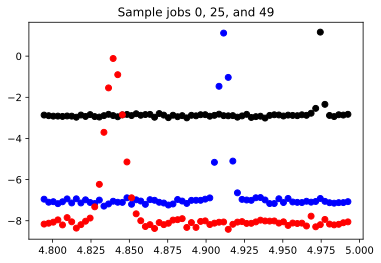

In [37]:
# Plot sample data to get sense of where peaks appear
plt.scatter(freq_GHz, sweeps[0], color='black')
plt.scatter(freq_GHz, sweeps[25], color='blue')
plt.scatter(freq_GHz, sweeps[49], color='red')
plt.title("Sample jobs 0, 25, and 49")
plt.show()

In [38]:
# Observe roughly where peaks are
rough_freqs_GHz = []
rough_freqs_Hz = []
for sweep in sweeps: 
    freq = freq_GHz[sweep.index(max(sweep))]
    rough_freqs_GHz.append(freq)
    rough_freqs_Hz.append(freq*GHz)

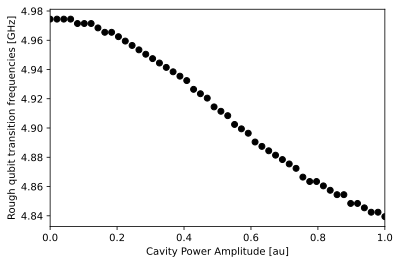

In [40]:
# Observe (hopefully) linear behavior, see how good approximation is

plt.scatter(cav_amps, rough_freqs_GHz, color='black')
plt.xlim([min(cav_amps), max(cav_amps)])
plt.xlabel("Cavity Power Amplitude [au]")
plt.ylabel("Rough qubit transition frequencies [GHz]")
plt.show()

In [41]:
# create amplitude-specific frequency sweep arrays to allow for better curve fitting --> better freq estimates
mod_freqs_GHz = [] # list of freq sweep arrays
mod_freqs_Hz = []
for freq in rough_freqs_Hz: # center each sweep on approximate guess
    freq_span = 50 * MHz
    freq_step = freq_span / 64 # makes 65 samples per experiment
    freq_min = freq - freq_span / 2
    freq_max = freq + freq_span / 2
    freq_GHz = np.arange(freq_min / GHz, freq_max / GHz, freq_step / GHz)
    freq_Hz = np.arange(freq_min, freq_max, freq_step)
    mod_freqs_GHz.append(freq_GHz)
    mod_freqs_Hz.append(freq_Hz)

In [42]:
# Check sample parameters to make sure specific freq arrays assembled properly
test_freq_interval_last = mod_freqs_GHz[49]
test_freqs_interval_first = mod_freqs_GHz[0]

min(mod_freqs_Hz[25]), max(mod_freqs_Hz[25]), len(mod_freqs_GHz), len(schedules)

(4886440264.701725, 4935659014.701725, 50, 50)

In [43]:
# Assemble modified schedule freqs
mod_schedule_freqs = []
for freq_array in mod_freqs_Hz: 
    mod_schedule_freq = [{drive_chan: freq} for freq in freq_array]
    mod_schedule_freqs.append(mod_schedule_freq)
    
len(mod_schedule_freqs)

50

In [44]:
# Modified programs
mod_programs = []
for i in range (len(schedules)):
    mod_program = assemble(schedules[i], backend=backend, meas_level=1, 
                       meas_return='avg', shots=num_shots, schedule_los=mod_schedule_freqs[i])
    mod_programs.append(mod_program)

In [45]:
# Run and store modified jobs
mod_jobs = []
mod_job_IDs = []
j = 0
for mod_program in mod_programs: 
    j += 1
    mod_job = backend.run(mod_program)
    mod_tag = mod_job.job_id()
    print(f"Job {mod_tag} is job number {j}.")
    job_monitor(mod_job)
    mod_jobs.append(mod_job)
    mod_job_IDs.append(mod_tag)

Job 5f2d86fea86d70001adf8ba0 is job number 1.
Job Status: job has successfully run
Job 5f2d8a10cc0ccf001946dfc5 is job number 2.
Job Status: job has successfully run
Job 5f2d8acc764208001a73e116 is job number 3.
Job Status: job has successfully run
Job 5f2d8dcb75f180001a56d328 is job number 4.
Job Status: job has successfully run
Job 5f2d8e98252dfd001a346725 is job number 5.
Job Status: job has successfully run
Job 5f2d91a9385d440019c426b8 is job number 6.
Job Status: job has successfully run
Job 5f2d9374385d440019c426e3 is job number 7.
Job Status: job has successfully run
Job 5f2d96d31676e8001ac081a5 is job number 8.
Job Status: job has successfully run
Job 5f2d987e5cf07d001943fd3a is job number 9.
Job Status: job has successfully run
Job 5f2d99e05e084e001ae14982 is job number 10.
Job Status: job has successfully run
Job 5f2d9b095cf07d001943fd59 is job number 11.
Job Status: job has successfully run
Job 5f2d9ca5764208001a73e235 is job number 12.
Job Status: job has successfully run
J

In [46]:
# Extract modified sweeps
mod_sweeps = []
for mod_job in mod_jobs: 
    mod_sweep = []
    mod_result = mod_job.result(timeout=120)
    for i in range (len(mod_result.results)):
        res = mod_result.get_memory(i)*scale_factor
        mod_sweep.append(np.real(res[qubit]))
    mod_sweeps.append(mod_sweep)

In [47]:
# Define curve fitting function, allow for large number of max calls due to variety of plots from jobs
def fit_function(x_values, y_values, function, init_params):
    fitparams, conv = curve_fit(function, x_values, y_values, init_params, maxfev=300000) 
    y_fit = function(x_values, *fitparams)
    return fitparams, y_fit

In [48]:
# Some frequency arrays were length 65 instead of 64 --> normalize all to be length 64 for datafit purposes
resized_freqs_GHz = []
for freqs in mod_freqs_GHz: 
    if (len(freqs) > 64):
        resized = freqs[:64]
        resized_freqs_GHz.append(resized)
    else: 
        resized_freqs_GHz.append(freqs)

In [49]:
# Sample curve fit

freq_params_12, freq_fit_12 = fit_function(resized_freqs_GHz[12], mod_sweeps[12], 
         hermi
_, freq_12, _, _ = freq_params_12

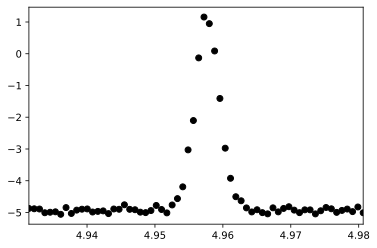

In [50]:
# Graph sample data

plt.scatter(resized_freqs_GHz[12], mod_sweeps[12], color='black')
# plt.plot(mod_freqs_GHz[49], freq_fit_49, color='red')
plt.xlim([min(resized_freqs_GHz[12]), max(resized_freqs_GHz[12])])
plt.show()

In [80]:
# Fit all sets of sweeps, extract peak frequency value, store as respective qubit transition freq
mod_qubit_freqs = []
mod_freq_fits = []
levels = []
for i in range (len(mod_sweeps)):
    peak_guess = resized_freqs_GHz[i][mod_sweeps[i].index(max(mod_sweeps[i]))]
    mod_freq_params, mod_freq_fit = fit_function(resized_freqs_GHz[i], mod_sweeps[i], 
         lambda x, A, mod_qubit_freq, B, C: (A / np.pi) * (B / ((x - mod_qubit_freq)**2 + B**2)) + C,
        [100, peak_guess, 1, -2]) # initial parameters for curve_fit
    _, mod_qubit_freq, _, level = mod_freq_params # stores height offset for use in fwhm later
    mod_qubit_freqs.append(mod_qubit_freq)
    mod_freq_fits.append(mod_freq_fit)
    levels.append(level)
    
mod_qubit_freqs

[4.974514077218629,
 4.974362474925895,
 4.973967297681225,
 4.973353238185298,
 4.9725022204700675,
 4.971452851200952,
 4.970083995667209,
 4.968552209419252,
 4.9667911072997075,
 4.964840256447348,
 4.962590777447464,
 4.960224723227389,
 4.957683348136816,
 4.954929338390731,
 4.9518992577470184,
 4.948775803377922,
 4.945453995066577,
 4.941839105966416,
 4.9384500180179565,
 4.934503673529229,
 4.930534447507629,
 4.926261863112715,
 4.922354637594969,
 4.918549580634427,
 4.9144116622565095,
 4.910432173822687,
 4.906508976887221,
 4.902792497202762,
 4.898641105201486,
 4.894982092139963,
 4.89141533591858,
 4.887550176483735,
 4.88420720387029,
 4.88038581116029,
 4.876768868483088,
 4.873706082887366,
 4.870417470169694,
 4.867418205415865,
 4.864659762315882,
 4.861637846551239,
 4.859212775402071,
 4.856856242123134,
 4.855711369755303,
 4.8519006101228985,
 4.849542845927964,
 4.847429262985396,
 4.845263575164765,
 4.844347671075523,
 4.842250935793406,
 4.83964020825608

[4.974514077194733,
 4.97436247479797,
 4.973967297732364,
 4.973353237409983,
 4.9725022182236245,
 4.971452851031554,
 4.9700839946204045,
 4.968552209297798,
 4.9667911076101,
 4.964840256582409,
 4.962590777127123,
 4.96022472326798,
 4.95768334836646,
 4.954929337767719,
 4.951899257536092,
 4.9487758033779965,
 4.945453995065911,
 4.941839105814592,
 4.938450018618969,
 4.934503673678047,
 4.93053444750016,
 -255.808713595845,
 4.922354637531445,
 4.918549580494942,
 4.914411662437053,
 4.9104321740370445,
 4.906508976621255,
 4.902792497799563,
 4.898641104980155,
 4.894982090463258,
 4.891415335806484,
 4.887550177342663,
 4.884207204562057,
 4.880385811784424,
 4.876768869644136,
 4.873706085935778,
 4.870417472500766,
 4.867418207578927,
 4.8646597627264185,
 4.861637848667172,
 4.859212775981692,
 4.856856246191092,
 4.855711370027606,
 4.851900609115187,
 4.849542844232845,
 4.847429263206691,
 4.845263575229499,
 4.844347671027946,
 4.842250935631963,
 4.839640208053713]

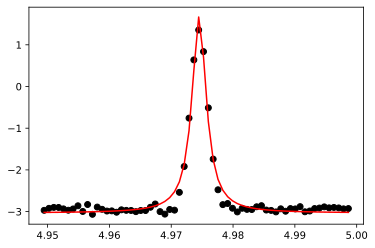

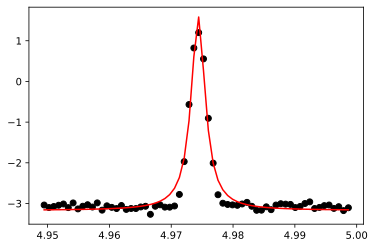

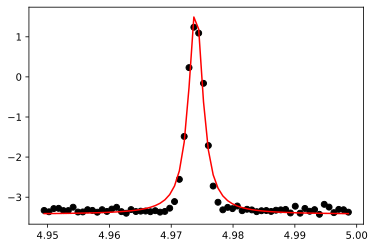

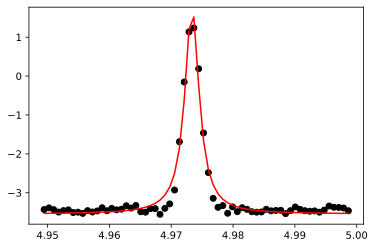

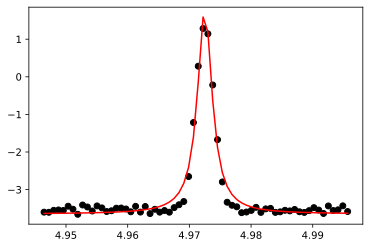

...

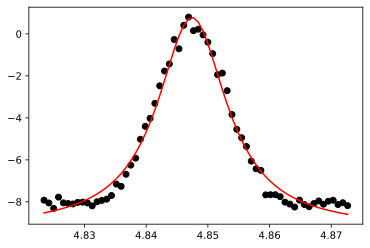

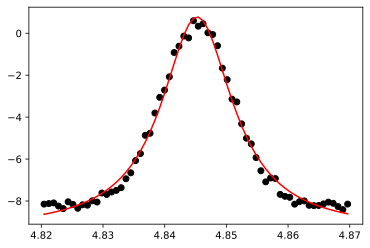

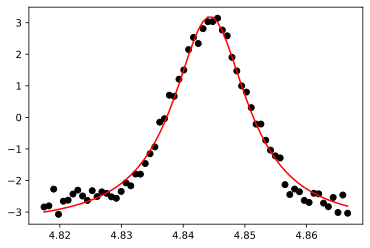

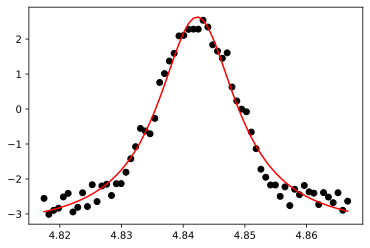

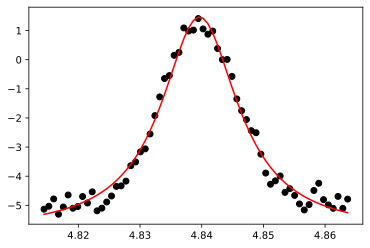

In [81]:
# Check to make sure all curve fits look reasonable
for i in range(len(mod_sweeps)):
    plt.scatter(resized_freqs_GHz[i], mod_sweeps[i], color='black')
    plt.plot(resized_freqs_GHz[i], mod_freq_fits[i], color='red')
    plt.plot
    plt.show()

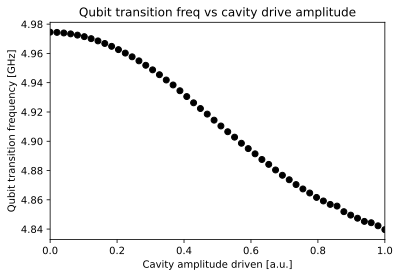

In [82]:
# Plot amplitude transition relationship
plt.scatter(cav_amps, mod_qubit_freqs, color='black')
plt.xlim([min(cav_amps), max(cav_amps)])
plt.xlabel("Cavity amplitude driven [a.u.]")
plt.ylabel("Qubit transition frequency [GHz]")
plt.title("Qubit transition freq vs cavity drive amplitude")
plt.show()


In [83]:
# Fit linear relationship
relation_params, relation_fit = fit_function(cav_amps, mod_qubit_freqs, 
         lambda x, A, B: A*x + B,
        [-0.2, 4.97]) # initial parameters for curve_fit
slope, yint = relation_params

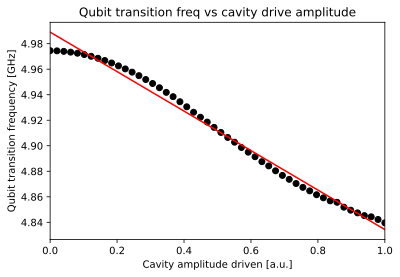

In [84]:
# Check curvefit
plt.scatter(cav_amps, mod_qubit_freqs, color='black')
plt.plot(cav_amps, relation_fit, color='red')
plt.xlim([min(cav_amps), max(cav_amps)])
plt.xlabel("Cavity amplitude driven [a.u.]")
plt.ylabel("Qubit transition frequency [GHz]")
plt.title("Qubit transition freq vs cavity drive amplitude")
plt.show()

In [85]:
chi_amp_ratio_GHz = abs(slope) # slope represents how dispersion changes with power (number of photons)
print (f"Ratio of dispersion to power amplitude is {chi_amp_ratio_GHz} GHz/au")

Ratio of dispersion to power amplitude is 0.15468662256563645 GHz/au


In [86]:
# We can also check relationship btwn squared halfwidth and power amplitude

# Define function to get linewidth (fwhm)
from scipy.interpolate import splrep, sproot, splev

def fwhm(indep, data):
    half_max = max(data)/2.0
    s = splrep(indep, data - half_max)
    roots = sproot(s)
    return (abs(roots[1]-roots[0])), roots[0], roots[1], half_max

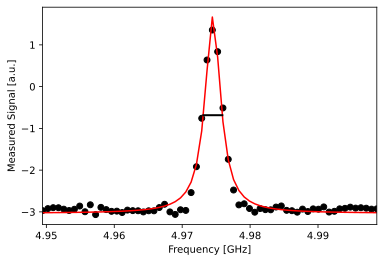

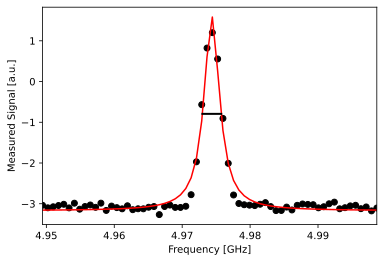

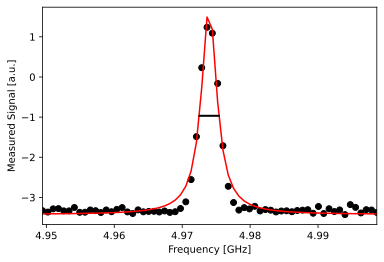

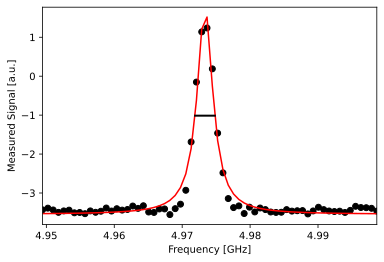

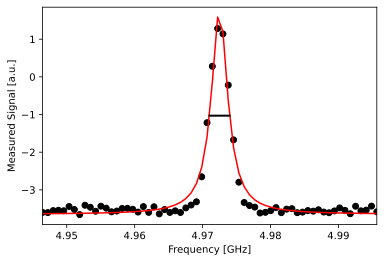

...

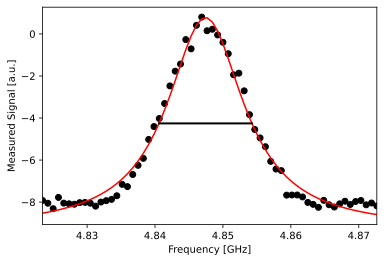

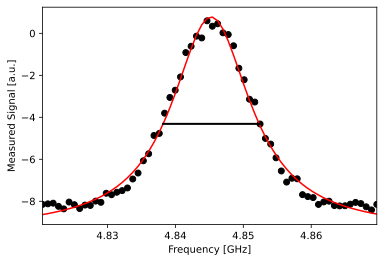

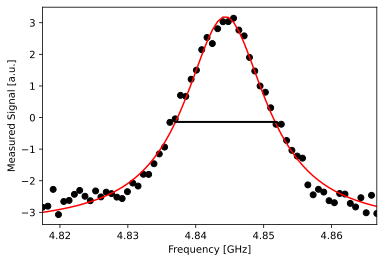

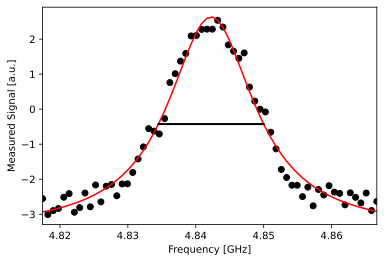

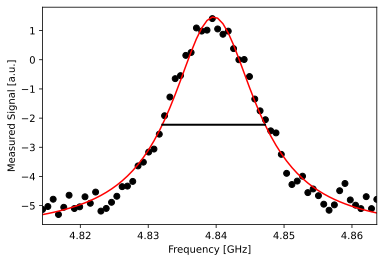

In [87]:
kappas = []
for i in range(len(mod_sweeps)):
    mod_data = mod_freq_fits[i] - levels[i]
    kappa, lhs, rhs, half_max = fwhm(resized_freqs_GHz[i], mod_data)
    kappas.append(kappa)
    plt.scatter(resized_freqs_GHz[i], mod_sweeps[i], color='black')
    plt.plot(resized_freqs_GHz[i],  mod_freq_fits[i], color='red')
    plt.xlim([min(resized_freqs_GHz[i]), max(resized_freqs_GHz[i])])
    plt.xlabel("Frequency [GHz]")
    plt.ylabel("Measured Signal [a.u.]")
    plt.plot([lhs, rhs], [half_max + levels[i], half_max + levels[i]], color='k', linestyle='-', linewidth=2, label='kappa')
    plt.show()

In [88]:
# Get halfwidths and square
deltas = np.asarray(kappas) / 2.0
del_squares = np.square(deltas)

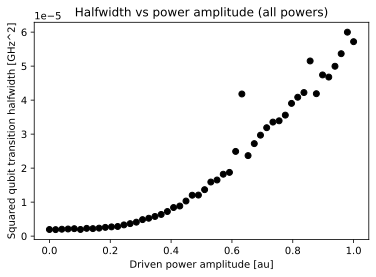

In [89]:
# Check (hopefully) linear relationship
plt.scatter(cav_amps, del_squares, color='black')
plt.xlabel("Driven power amplitude [au]")
plt.ylabel("Squared qubit transition halfwidth [GHz^2]")
plt.title("Halfwidth vs power amplitude (all powers)")
plt.show()

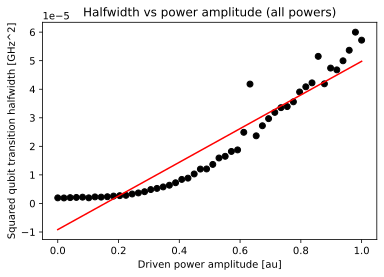

In [90]:
# Fit linear relationship
width_params, width_fit = fit_function(cav_amps, del_squares, 
         lambda x, A, B: A*x + B,
        [5, -1]) # initial parameters for curve_fit
width_slope, width_yint = width_params

# Plot fit
plt.scatter(cav_amps, del_squares, color='black')
plt.plot(cav_amps, width_fit, color='red')
plt.xlabel("Driven power amplitude [au]")
plt.ylabel("Squared qubit transition halfwidth [GHz^2]")
plt.title("Halfwidth vs power amplitude (all powers)")
plt.show()

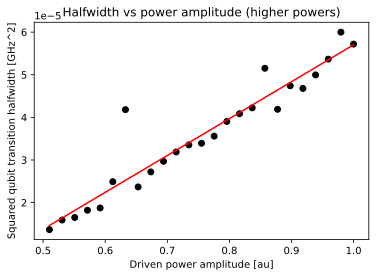

In [91]:
# Fit second half properly
half_amps = int(num_amps/2)
partial_cav_amps = cav_amps[half_amps:]
partial_del_squares = del_squares[half_amps:]
partial_width_params, partial_width_fit = fit_function(partial_cav_amps, partial_del_squares, 
         lambda x, A, B: A*x + B,
        [5, -1]) # initial parameters for curve_fit
partial_width_slope, partial_width_yint = partial_width_params

# Plot fit
plt.scatter(partial_cav_amps, partial_del_squares, color='black')
plt.plot(partial_cav_amps, partial_width_fit, color='red')
plt.xlabel("Driven power amplitude [au]")
plt.ylabel("Squared qubit transition halfwidth [GHz^2]")
plt.title("Halfwidth vs power amplitude (higher powers)")
plt.show()

In [92]:
print(f"d^2 / power amplitude slope is {width_slope * GHz**2 / MHz**2} MHz^2/au with all data considered")
print(f"d^2 / power amplitude slope is {partial_width_slope * GHz**2 / MHz**2} MHz^2/au with right half of data considered")

d^2 / power amplitude slope is 58.95802738173742 MHz^2/au with all data considered
d^2 / power amplitude slope is 86.53374695621623 MHz^2/au with right half of data considered


In [93]:
# Save data externally
import json 

def saveToFile(datas, filename):
    filehandler = open(filename, 'w')
    json.dump(datas, filehandler)
    filehandler.close()

In [2]:
# get all relevant parameters for amplitude vs frequency experiment

this_data = {'meas_amp': meas_amp, 'acq_dur_us': acq_samp_us, 'cav_amps': cav_amps.tolist(), 
             'generic_freq_span': freq_span_Hz, 'generic_freq_step': freq_step_Hz, 'rough_maxima': rough_freqs_GHz, 
             'mod_freq_span': 50*MHz, 'mod_freq_span': 50*MHz/64, 'mod_qubit_freqs' : mod_qubit_freqs,
             'job_IDs': jobIDs, 'mod_job_IDs': mod_job_IDs, 'chi_amp_ratio_GHz_au': chi_amp_ratio_GHz}

saveToFile(this_data, 'PowerAmplitudeVsQubitFrequency.txt')
saveToFile(this_data, 'PowerAmplitudeVsQubitFrequency_1.txt')

NameError: name 'meas_amp' is not defined

In [100]:
# get all relevant parameters for amplitude vs cavity halfwidth experiment

that_data = {'meas_amp': meas_amp, 'acq_dur_us': acq_samp_us,
             'cav_amps': cav_amps.tolist(), 'del_squares': del_squares.tolist(), 
             'partial_cav_amps': partial_cav_amps.tolist(), 'partial_del_squares': partial_del_squares.tolist(),
            'job_IDs': jobIDs, 'mod_job_IDs': mod_job_IDs}

saveToFile(that_data, 'PowerAmplitudeVsQubitHalfwidthSquared.txt')
saveToFile(that_data, 'PowerAmplitudeVsQubitHalfwidthSquared_1.txt')